In [16]:
# import packages
import xarray as xr
import rioxarray
import rasterio
import rasterio.plot as show
import geopandas as gpd
from rasterio.features import geometry_mask
from rasterstats import zonal_stats
import numpy as np
import regionmask
import matplotlib.pyplot as plt
import cartopy.crs as ccrs


In [ ]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import seaborn as sns
import geopandas as gpd
import earthpy as et
import xarray as xr
# Spatial subsetting of netcdf files
import regionmask

## Setup

In [17]:
# Define netCDF file location
ds_location = r"C:\Users\Kris\Documents\amazonforcast\data\2023\202301\LIS_HIST_2023_Jan.nc"
# Define shape file location
shp_location = r"C:\Users\Kris\Documents\amazonforcast\gisfiles\hydrobasins shape\hybas_sa_lev05_areaofstudy.shp"

# netcdf file loader
ds = xr.open_dataset(ds_location)
# .shp file loader
hybas_sa_lev05 = gpd.read_file(shp_location)


Dataset spatial shape: (540, 660)


<xarray.DataArray 'Rainf_tavg' (time: 31, north_south: 540, east_west: 660)>
[11048400 values with dtype=float32]
Coordinates:
  * time         (time) datetime64[ns] 2023-01-01 2023-01-02 ... 2023-01-31
  * north_south  (north_south) float64 -21.0 -20.95 -20.9 ... 5.9 5.95 6.0
  * east_west    (east_west) float64 -82.0 -81.95 -81.9 ... -49.1 -49.05 -49.0
Attributes:
    units:          kg m-2 s-1
    standard_name:  precipitation_rate
    long_name:      precipitation rate
    vmin:           0.0
    vmax:           0.0

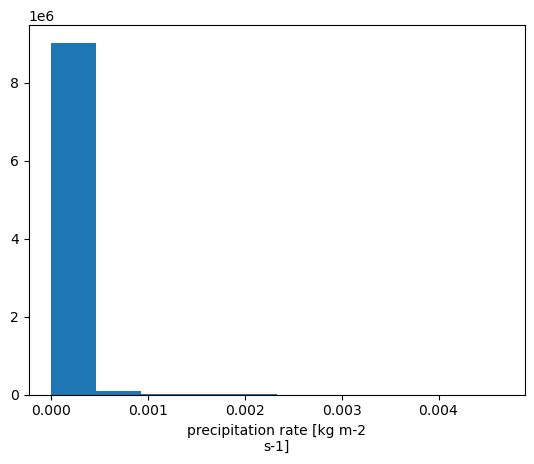

In [18]:
# Check dimensions
# print(f"East-West shape: {ds.east_west.shape}")
# print(f"North-South shape: {ds.north_south.shape}")
print(f"Dataset spatial shape: ({ds.sizes['north_south']}, {ds.sizes['east_west']})")

# Create a list for the variable names
# list_of_variables = ['Rainf_tavg','SoilMoist_inst','Qs_tavg','Evap_tavg','SoilTemp_inst','Qair_f_tavg'] 
rainf_tavg = ds['Rainf_tavg']
ds['Rainf_tavg'].plot()
rainf_tavg


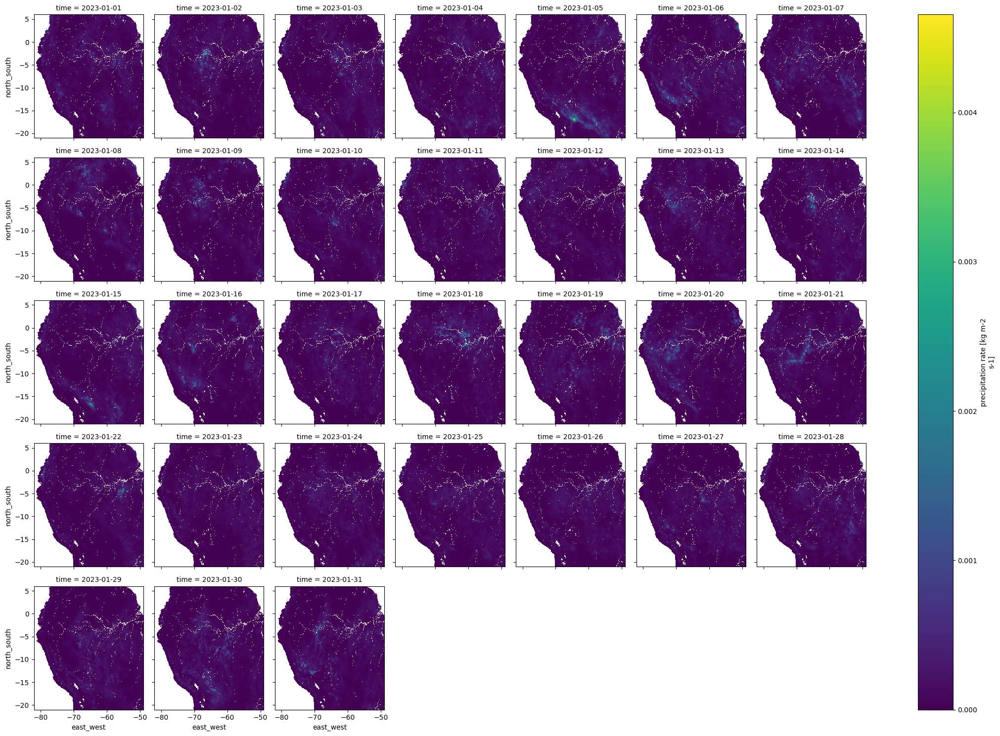

In [4]:
# Spatial plot for netCDF
rainf_tavg.plot(col='time', col_wrap=7)

plt.show()

In [72]:
# Reproject current crs of gdf to epsg 4326
print(f"East-West range: {ds.east_west.min().item()} to {ds.east_west.max().item()}")
print(f"North-South range: {ds.north_south.min().item()} to {ds.north_south.max().item()}")

print(hybas_sa_lev05.total_bounds)  # This will print the bounds of the regions in your GeoDataFrame

# Print current CRS of the GeoDataFrame
print(f"Original CRS: {hybas_sa_lev05.crs}")

# Reproject to WGS84 (latitude and longitude)
hybas_sa_lev05 = hybas_sa_lev05.to_crs(epsg=4326)

# Print new CRS to confirm
print(f"Reprojected CRS: {hybas_sa_lev05.crs}")

# Check the bounds again after reprojection
print(hybas_sa_lev05.total_bounds)

East-West range: -82.0 to -49.0
North-South range: -21.0 to 6.0
[-9054007.67266785 -2376978.16229946 -5440740.11254905   671070.13011205]
Original CRS: EPSG:3857
Reprojected CRS: EPSG:4326
[-81.33353475 -20.87498542 -48.875        6.01723395]


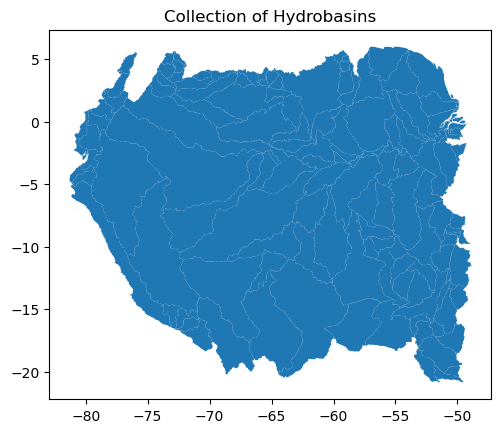

In [73]:
# Plot the loaded shapefile using matplotlib
f, ax = plt.subplots()
hybas_sa_lev05.plot(ax=ax)
ax.set(title="Collection of Hydrobasins")

plt.show()

# Fix below

In [74]:
#print(hybas_sa_lev05['PFAF_ID'])

select_all_poly = hybas_sa_lev05[hybas_sa_lev05.PFAF_ID.isin(range(61564, 67209))]
#select_all_poly.plot()
#plt.show()

select_all_poly.PFAF_ID

0      61581
1      61593
2      61592
3      61595
4      61594
       ...  
146    67205
147    67206
148    67207
149    67208
150    66405
Name: PFAF_ID, Length: 151, dtype: int64

In [75]:
# Convert data types if necessary
#ds['east_west'] = ds.east_west.astype(np.float64)
#ds['north_south'] = ds.north_south.astype(np.float64)

# Create meshgrid for coordinates
lon, lat = np.meshgrid(rainf_tavg.east_west.values, rainf_tavg.north_south.values)

# Flatten the meshgrid for plotting
lon_flat = lon.flatten()
lat_flat = lat.flatten()

# Debugging step: Check coordinate values
print("Longitude range:", lon_flat.min(), "to", lon_flat.max())
print("Latitude range:", lat_flat.min(), "to", lat_flat.max())

Longitude range: -82.0 to -49.0
Latitude range: -21.0 to 6.0


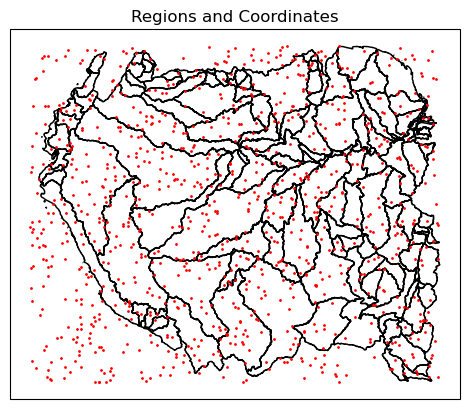

In [76]:
# Plot regions and coordinates to verify alignment
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
select_all_poly.plot(ax=ax, edgecolor='black', facecolor='none')
subset_indices = np.random.choice(len(lon_flat), size=1000, replace=False)
ax.scatter(lon_flat[subset_indices], lat_flat[subset_indices], color='red', s=1, transform=ccrs.PlateCarree())
ax.set_title('Regions and Coordinates')
plt.show()


In [77]:
# Convert to <class 'numpy.uint32'>
ds['east_west'] = ds.east_west.astype(np.float32)
ds['north_south'] = ds.north_south.astype(np.float32)

# Make gdf mask
mask = regionmask.mask_3D_geopandas(geodataframe = select_all_poly, lon_or_obj= ds['east_west'], lat = ds['north_south'])
mask

<xarray.DataArray 'mask' (region: 151, north_south: 540, east_west: 660)>
array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
...
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])
Coordinates:
  * north_south  (north_south) float32 -21.0 -20.95 -20.9 ... 5.9 5.95 6.0
  * east_west    (east_west) float32 -82.0 -81.95 -81.9 ... -49.1 -49.05 -49.0
  * region       (region) int64 0 1 2 3 4 5 6 7 ... 144 145 146 147 148 149 150
Attributes:
    standard_name:  region

In [78]:
rainf_tavg_where_mask = rainf_tavg.where(mask)


In [79]:
rainf_tavg_where_mask

<xarray.DataArray 'Rainf_tavg' (time: 31, north_south: 2, east_west: 2,
                                region: 151)>
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]],


       [[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]],


       [[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]],

...

       [[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]],


       [[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]],


       [[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]], dtype=float32)
Coordinates:
  * time         (time) datetime64[ns] 2023-01-01 2023-01-02 ... 2023-01-31
  * north_south  (north_south) float64 -21.0 6.0
  * east_west    (east_west) float64 -82.0 -49.0
  * region       (region) int64 0 1 2 3 4 5 6 7 ... 144 145 146 147 148 149 150
Attributes:
    units:          kg m-2 s-1
    standard_name:  precipitation_rate
    long_name:      precipitation rate
    vmin:           0.0
    vmax:           0.0

In [62]:
# Debugging step: Check mask shape and values
print(f"Mask shape: {mask.shape}")
print(f"Mask values: {mask}")

Mask shape: (151, 540, 660)
Mask values: <xarray.DataArray 'mask' (region: 151, north_south: 540, east_west: 660)>
array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],


<xarray.DataArray 'mask' (region: 151, north_south: 540, east_west: 660)>
array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
...
        ...,
        [Fa

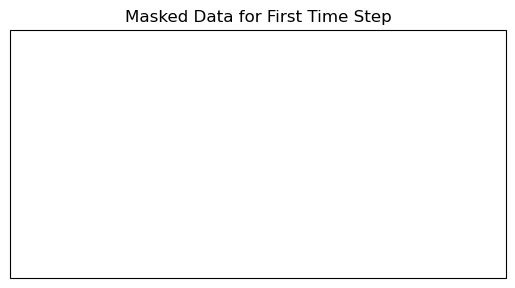

In [65]:
# Check if the mask is empty
if mask.shape[0] == 0:
    print("No gridpoint belongs to any region.")
else:
    # Debugging step: Inspect mask
    print(mask)

    # Apply the mask to your DataArray
    rainf_tavg_where_mask = ds['Rainf_tavg'].where(mask)
    print("Mask applied successfully.")

    # Debugging step: Inspect masked data array
    print(rainf_tavg_where_mask)

    # Check for NaN values in masked data array
    nan_values = rainf_tavg_where_mask.isnull().sum().item()
    print(f"Number of NaN values: {nan_values}")

    # Additional step to plot masked data
    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
    rainf_tavg_where_mask.isel(time=0).plot(ax=ax, transform=ccrs.PlateCarree())
    hybas_sa_lev05.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title('Masked Data for First Time Step')
    plt.show()

In [81]:
rainf_tavg_where_mask.dims

('time', 'north_south', 'east_west', 'region')

In [80]:
rainf_tavg_where_mask.region

<xarray.DataArray 'region' (region: 151)>
array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,
        28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,
        56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
        70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,
        84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,
        98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111,
       112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125,
       126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139,
       140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150], dtype=int64)
Coordinates:
  * region   (region) int64 0 1 2 3 4 5 6 7 ... 143 144 145 146 147 148 149 150

In [34]:
rainf_tavg_where_mask.plot(col="time",
                           row="region",
                           sharey=False, sharex=False)
plt.show()

In [40]:
summary = rainf_tavg_where_mask.groupby("time").mean(["north_south", "east_west"])
summary.to_dataframe()

Rainf_tavg
time       region            
2023-01-01 0              NaN
           1              NaN
           2              NaN
           3              NaN
           4              NaN
...                       ...
2023-01-31 146            NaN
           147            NaN
           148            NaN
           149            NaN
           150            NaN

[4681 rows x 1 columns]

# Ignore below

In [7]:
# Set the spatial dimensions (assuming they are 'longitude' and 'latitude')
rainf_tavg = rainf_tavg.rio.set_spatial_dims(x_dim="east_west", y_dim="north_south")

In [8]:
# Ensure the data has a CRS
if not rainf_tavg.rio.crs:
    print('# Replace with the appropriate EPSG code if known')
    rainf_tavg.rio.write_crs("EPSG:4326", inplace=True)  # Replace with the appropriate EPSG code if known

# Replace with the appropriate EPSG code if known


In [9]:
# Ensure the CRS matches between the datasets
if hybas_sa_lev05.crs != rainf_tavg.rio.crs:
    print('Ensure the CRS matches between the datasets')
    gdf = hybas_sa_lev05.to_crs(rainf_tavg.rio.crs)

Ensure the CRS matches between the datasets


In [22]:
# Print bounds for debugging
print("Raster bounds:", rainf_tavg.rio.bounds())
print("Shapefile bounds:", gdf.total_bounds)

print(type(rainf_tavg.rio.bounds()))
print(type(gdf.total_bounds))

Raster bounds: (-82.02503793626707, -21.025046382189238, -48.97496206373293, 6.025046382189239)
Shapefile bounds: [-81.33353475 -20.87498542 -48.875        6.01723395]
<class 'tuple'>
<class 'numpy.ndarray'>


In [11]:
# Initialize a list to store the results
all_zonal_stats = []

In [41]:
rainf_tavg_time_0 = rainf_tavg[0].values

In [13]:
rainf_tavg.rio.bounds()

(-82.02503793626707,
 -21.025046382189238,
 -48.97496206373293,
 6.025046382189239)

In [16]:
for day in range(rainf_tavg.shape[0]):
    # Extract the data for the current day
    nc_arr_vals = rainf_tavg[day].values
    affine = rasterio.transform.from_bounds(*rainf_tavg.rio.bounds(), nc_arr_vals.shape[1], nc_arr_vals.shape[0])
    
    # Store results for the current day
    daily_stats = []

    # Calculate zonal statistics for each geometry
    for idx, row in gdf.iterrows():
        geometry = row['geometry']
        
        # Create a mask for the current geometry
        mask = geometry_mask([geometry], transform=affine, invert=True, out_shape=nc_arr_vals.shape)
        
        # Apply the mask to the data
        masked_data = np.where(mask, nc_arr_vals, np.nan)
        
        # Calculate statistics
        stats = {
            'day': day + 1,
            'geometry_id': idx,
            'mean': np.nanmean(masked_data),
            'min': np.nanmin(masked_data),
            'max': np.nanmax(masked_data)
        }
        
        daily_stats.append(stats)
    
    all_zonal_stats.extend(daily_stats)

C:\Users\Kris\AppData\Local\Temp\ipykernel_49956\633647711.py:23: RuntimeWarning: Mean of empty slice
  'mean': np.nanmean(masked_data),
C:\Users\Kris\AppData\Local\Temp\ipykernel_49956\633647711.py:24: RuntimeWarning: All-NaN slice encountered
  'min': np.nanmin(masked_data),
C:\Users\Kris\AppData\Local\Temp\ipykernel_49956\633647711.py:25: RuntimeWarning: All-NaN slice encountered
  'max': np.nanmax(masked_data)
C:\Users\Kris\AppData\Local\Temp\ipykernel_49956\633647711.py:23: RuntimeWarning: Mean of empty slice
  'mean': np.nanmean(masked_data),
C:\Users\Kris\AppData\Local\Temp\ipykernel_49956\633647711.py:24: RuntimeWarning: All-NaN slice encountered
  'min': np.nanmin(masked_data),
C:\Users\Kris\AppData\Local\Temp\ipykernel_49956\633647711.py:25: RuntimeWarning: All-NaN slice encountered
  'max': np.nanmax(masked_data)
C:\Users\Kris\AppData\Local\Temp\ipykernel_49956\633647711.py:23: RuntimeWarning: Mean of empty slice
  'mean': np.nanmean(masked_data),
C:\Users\Kris\AppData\Local

## Plot raster and polygon together

In [42]:
import plotly.graph_objects as go

rainf_tavg_time_31 = rainf_tavg.isel(time = 30)

fig = go.Figure(data=[
    go.Heatmap(z =  rainf_tavg_time_31,  x=ds['east_west'].values, y=ds['north_south'].values),
])

# Add titles and labels
fig.update_layout(
    title='Evapotranspiration',
    xaxis_title='Longitude',
    yaxis_title='Latitude',
    height = 800,
    width = 1000)


fig.show()

In [45]:
import matplotlib.pyplot as plt

fig, ax = plt.subplot(1,1)
show(rainf_tavg_time_31, ax = ax)
hybas_sa_lev05.plot(ax = ax)
plt.show()

TypeError: subplot() takes 1 or 3 positional arguments but 2 were given

<Figure size 640x480 with 0 Axes>

In [50]:
rasterio.plot(rainf_tavg_time_31)

TypeError: 'module' object is not callable

# Find zonal stats for a single region 62297

In [82]:
hybas_sa_lev05

,HYBAS_ID,NEXT_DOWN,NEXT_SINK,MAIN_BAS,DIST_SINK,DIST_MAIN,SUB_AREA,UP_AREA,PFAF_ID,ENDO,COAST,ORDER_,SORT,Shape_Leng,Shape_Area,geometry
0,6.050134e+09,6.050102e+09,6.050004e+09,6.050004e+09,1275.6,1275.6,2264.6,100975.1,61581,0,0,2,42.0,2.682938,0.183604,"POLYGON ((-67.6875 4.03333, -67.69096 4.03422,..."
1,6.050135e+09,6.050134e+09,6.050004e+09,6.050004e+09,1278.6,1278.6,363.7,139064.0,61593,0,0,1,43.0,0.943771,0.029483,"POLYGON ((-67.8 3.85833, -67.81492 3.85869, -6..."
2,6.050135e+09,6.050134e+09,6.050004e+09,6.050004e+09,1278.6,1278.6,12532.3,12532.3,61592,0,0,2,44.0,7.085708,1.015267,"POLYGON ((-68.13333 2.91667, -68.1339 2.91888,..."
3,6.050137e+09,6.050135e+09,6.050004e+09,6.050004e+09,1307.0,1307.0,13041.0,84883.0,61595,0,0,1,49.0,9.702607,1.056988,"POLYGON ((-69.9875 2.95833, -69.98847 2.95456,..."
4,6.050137e+09,6.050135e+09,6.050004e+09,6.050004e+09,1307.2,1307.2,53814.6,53816.9,61594,0,0,2,50.0,16.338734,4.357097,"POLYGON ((-68.94167 3.49583, -68.94202 3.49826..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,6.050033e+09,0.000000e+00,6.050033e+09,6.050033e+09,0.0,0.0,22671.2,22671.2,67205,0,1,0,453.0,12.094961,1.833940,"MULTIPOLYGON (((-78.78472 1.825, -78.8033 1.82..."
147,6.050034e+09,0.000000e+00,6.050034e+09,6.050034e+09,0.0,0.0,22420.9,22420.9,67206,0,0,1,454.0,9.568663,1.814174,"POLYGON ((-77.39583 0.85417, -77.39498 0.85085..."
148,6.050034e+09,0.000000e+00,6.050034e+09,6.050034e+09,0.0,0.0,22325.0,22325.0,67207,0,1,0,455.0,11.275923,1.807964,"MULTIPOLYGON (((-77.27222 4, -77.27823 4.00072..."
149,6.050034e+09,0.000000e+00,6.050034e+09,6.050034e+09,0.0,0.0,15397.6,15397.6,67208,0,0,1,456.0,7.164665,1.249452,"POLYGON ((-77.34583 4.11667, -77.35242 4.11631..."


In [86]:
aoi_62297 = hybas_sa_lev05[hybas_sa_lev05.PFAF_ID == 62297]

In [90]:
aoi_62297.total_bounds

array([-78.4375    ,  -7.17109782, -65.7375    ,   1.32083333])

In [91]:
# Get lat min, max
aoi_lat = [float(aoi_62297.total_bounds[1]), float(aoi_62297.total_bounds[3])]
aoi_lon = [float(aoi_62297.total_bounds[0]), float(aoi_62297.total_bounds[2])]
# Notice that the longitude values have negative numbers
# we need these values in a global crs so we can subtract from 360
aoi_lat, aoi_lon

([-7.171097819109029, 1.3208333331918434],
 [-78.43749999962522, -65.73749999982509])

In [92]:
january_aoi_rainfall = ds['Rainf_tavg'].sel(
    east_west = slice(aoi_lon[0], aoi_lon[1]),
    north_south = slice(aoi_lat[0], aoi_lat[1]))


In [93]:
january_aoi_rainfall

<xarray.DataArray 'Rainf_tavg' (time: 31, north_south: 169, east_west: 253)>
[1325467 values with dtype=float32]
Coordinates:
  * time         (time) datetime64[ns] 2023-01-01 2023-01-02 ... 2023-01-31
  * north_south  (north_south) float32 -7.124 -7.074 -7.024 ... 1.241 1.291
  * east_west    (east_west) float32 -78.39 -78.34 -78.29 ... -65.83 -65.78
Attributes:
    units:          kg m-2 s-1
    standard_name:  precipitation_rate
    long_name:      precipitation rate
    vmin:           0.0
    vmax:           0.0

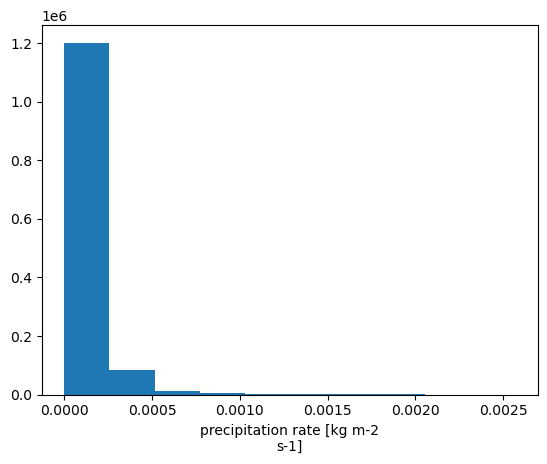

In [94]:
# Plot a quick histogram
january_aoi_rainfall.plot()
plt.show()

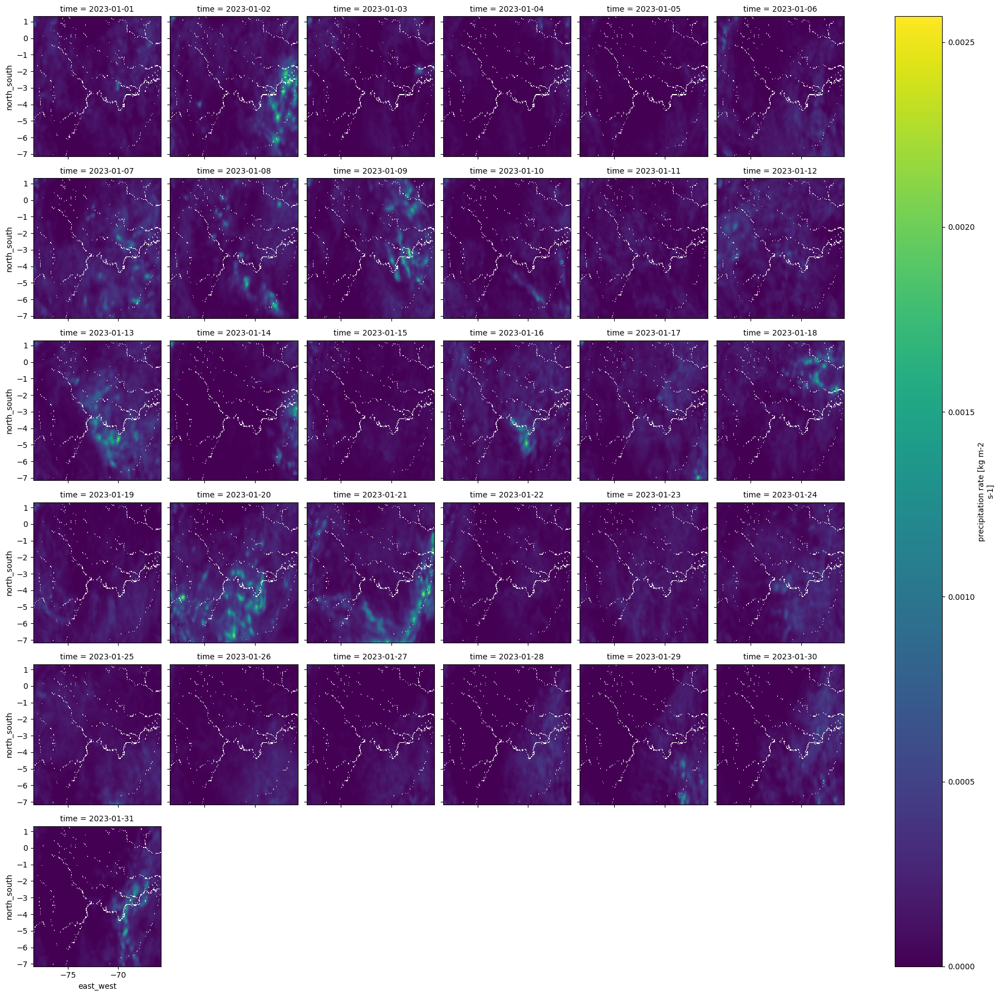

In [102]:
# Spatial Plot for the selected AOI (62297)
january_aoi_rainfall.plot(col='time',
                     col_wrap=6)

plt.show()

In [96]:
# Create a 3d mask - this contains the true / false values identifying pixels
# inside vs outside of the mask region
aoi_mask = regionmask.mask_3D_geopandas(aoi_62297,
                                         ds.east_west,
                                         ds.north_south)
aoi_mask

<xarray.DataArray 'mask' (region: 1, north_south: 540, east_west: 660)>
array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])
Coordinates:
  * north_south  (north_south) float32 -21.0 -20.95 -20.9 ... 5.9 5.95 6.0
  * east_west    (east_west) float32 -82.0 -81.95 -81.9 ... -49.1 -49.05 -49.0
  * region       (region) int64 90
Attributes:
    standard_name:  region

In [98]:
rainf_tavg

<xarray.DataArray 'Rainf_tavg' (time: 31, north_south: 540, east_west: 660)>
[11048400 values with dtype=float32]
Coordinates:
  * time         (time) datetime64[ns] 2023-01-01 2023-01-02 ... 2023-01-31
  * north_south  (north_south) float64 -21.0 -20.95 -20.9 ... 5.9 5.95 6.0
  * east_west    (east_west) float64 -82.0 -81.95 -81.9 ... -49.1 -49.05 -49.0
Attributes:
    units:          kg m-2 s-1
    standard_name:  precipitation_rate
    long_name:      precipitation rate
    vmin:           0.0
    vmax:           0.0

In [110]:
aoi_ds = ds.where(aoi_mask)
aoi_ds

<xarray.Dataset>
Dimensions:           (time: 31, north_south: 540, east_west: 660, region: 1,
                       SoilMoist_profiles: 4, SoilTemp_profiles: 4)
Coordinates:
  * time              (time) datetime64[ns] 2023-01-01 2023-01-02 ... 2023-01-31
  * north_south       (north_south) float32 -21.0 -20.95 -20.9 ... 5.9 5.95 6.0
  * east_west         (east_west) float32 -82.0 -81.95 -81.9 ... -49.05 -49.0
  * region            (region) int64 90
Dimensions without coordinates: SoilMoist_profiles, SoilTemp_profiles
Data variables: (12/32)
    lat               (time, north_south, east_west, region) float32 nan ... nan
    lon               (time, north_south, east_west, region) float32 nan ... nan
    Swnet_tavg        (time, north_south, east_west, region) float32 nan ... nan
    Lwnet_tavg        (time, north_south, east_west, region) float32 nan ... nan
    Qle_tavg          (time, north_south, east_west, region) float32 nan ... nan
    Qh_tavg           (time, north_south, east_west, region) float32 nan ... nan
    ...                ...
    Qair_f_tavg       (time, north_south, east_west, region) float32 nan ... nan
    Psurf_f_tavg      (time, north_south, east_west, region) float32 nan ... nan
    SWdown_f_tavg     (time, north_south, east_west, region) float32 nan ... nan
    LWdown_f_tavg     (time, north_south, east_west, region) float32 nan ... nan
    LAI_inst          (time, north_south, east_west, region) float32 nan ... nan
    Greenness_inst    (time, north_south, east_west, region) float32 nan ... nan
Attributes: (12/15)
    missing_value:           -9999.0
    NUM_SOIL_LAYERS:         4
    SOIL_LAYER_THICKNESSES:  [ 10.        30.000002  60.000004 100.      ]
    title:                   LIS land surface model output
    institution:             NASA GSFC
    source:                  
    ...                      ...
    comment:                 website: http://lis.gsfc.nasa.gov/
    MAP_PROJECTION:          EQUIDISTANT CYLINDRICAL
    SOUTH_WEST_CORNER_LAT:   -20.975
    SOUTH_WEST_CORNER_LON:   -81.975
    DX:                      0.05
    DY:                      0.05

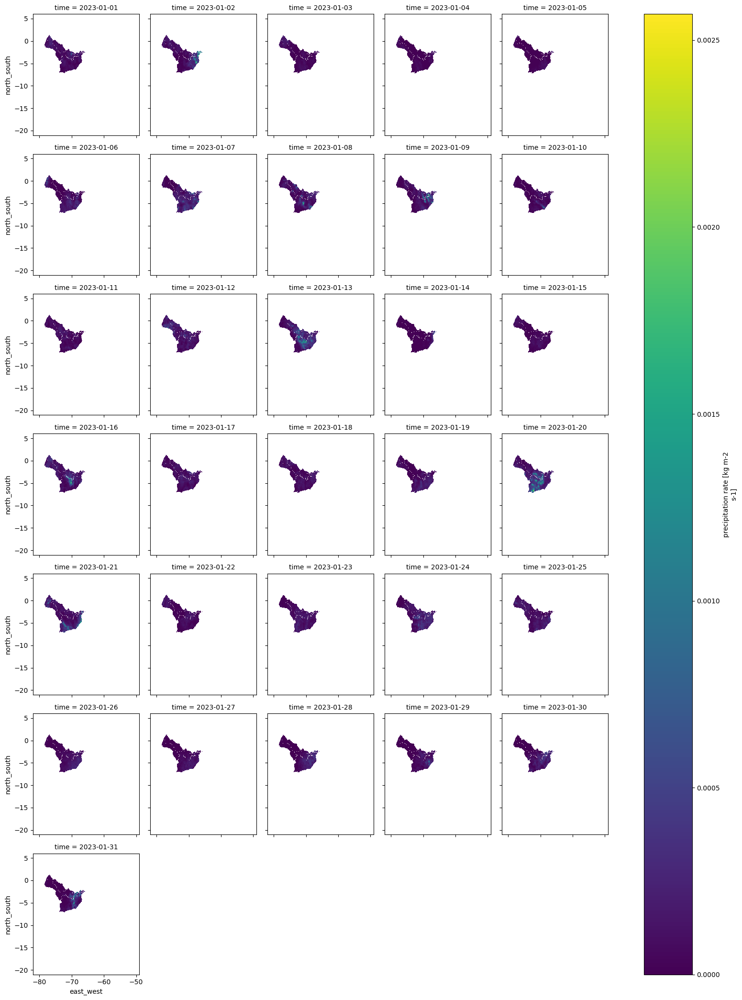

In [111]:
aoi_ds["Rainf_tavg"].plot(col='time',
                                   col_wrap=5)
                                   #figsize=(10, 10))
plt.show()

In [116]:
summary = aoi_ds['Rainf_tavg'].groupby("time").mean(["north_south", "east_west"])
aoi_ds_summary = summary.to_dataframe()

In [119]:
aoi_ds_summary

,,Rainf_tavg
time,region,
2023-01-01,90,0.000093
2023-01-02,90,0.000163
2023-01-03,90,0.000051
2023-01-04,90,0.000027
2023-01-05,90,0.000024
2023-01-06,90,0.000107
2023-01-07,90,0.000179
2023-01-08,90,0.000139
2023-01-09,90,0.000152


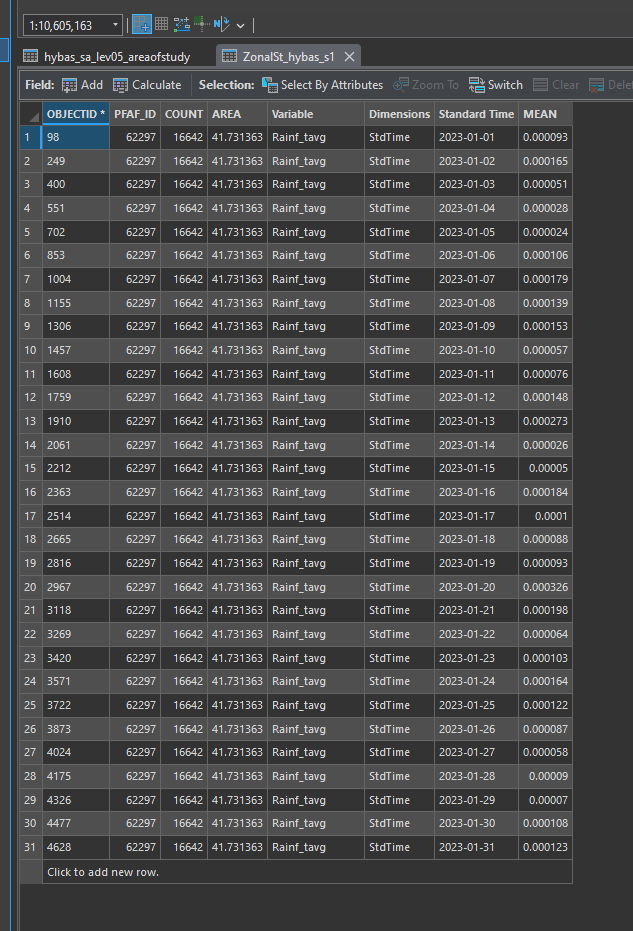